**Pooled mouse samples inspection**

In [25]:
# Basic libraries
import numpy as np
import pandas as pd
import scanpy as sc
import sys
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
# Custom functions
sys.path.append('../src')
from custom_functions import plot_clusters_2d
# Filter warnings
import warnings 
warnings.filterwarnings("ignore")

In [9]:
adata = sc.read_h5ad("../data/pooled_data/blood_mouse.h5ad")

In [10]:
# normalize and log transform the pooled dataset so that the data are correctly scaled among them
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)    
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]

In [11]:
adata

View of AnnData object with n_obs × n_vars = 3942 × 1822
    obs: 'sample', 'n_genes'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

We use the elbow method to find the ideal number of components

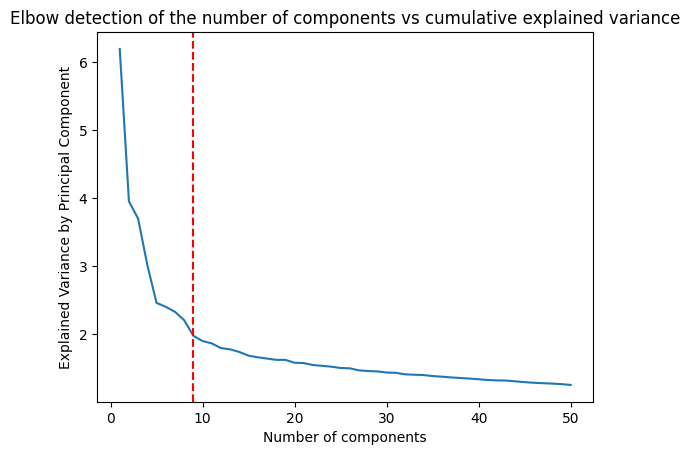

In [4]:
from custom_functions import locate_elbow
adata = locate_elbow(adata, show_plot=True)

Evaluating t-SNE parameters: 100%|██████████| 30/30 [24:20<00:00, 48.68s/it]


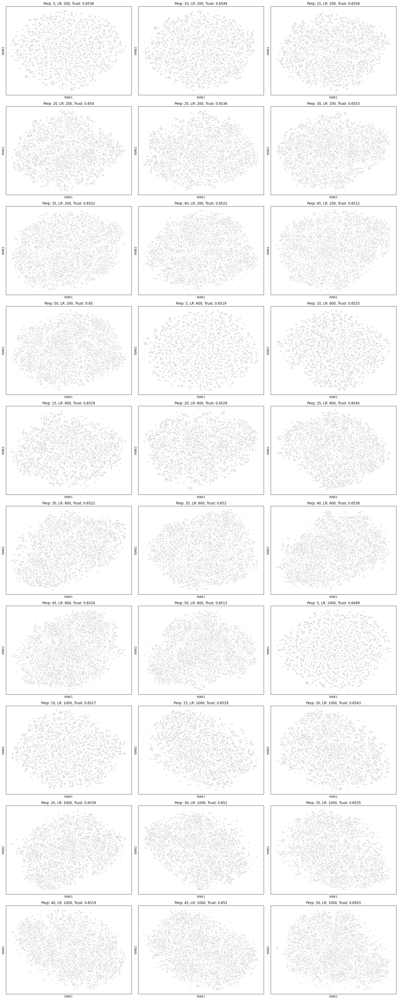

In [5]:
from custom_functions import evaluate_tsne
tsne_embeddings = evaluate_tsne(adata)

Evaluating UMAP parameters:   0%|          | 0/60 [00:00<?, ?it/s]

Evaluating UMAP parameters: 100%|██████████| 60/60 [14:38<00:00, 14.64s/it]


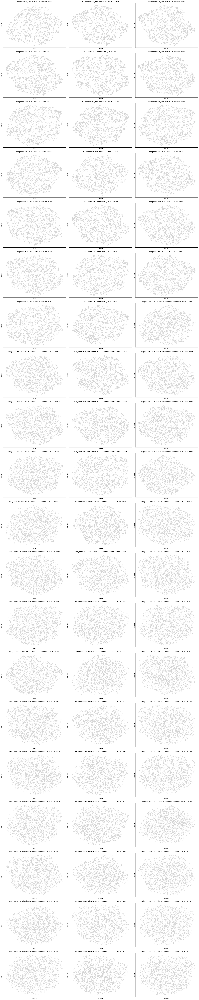

In [6]:
from custom_functions import evaluate_umap
umap_embeddings = evaluate_umap(adata)

After exploring various hyperparameter combinations for both t-SNE and UMAP, we determined that t-SNE was unable to effectively distinguish between two clusters, while UMAP demonstrated clear separation between clusters with multiple parameter settings (e.g., 35 neighbors and a minimum distance of 0.1). However, we opted not to use UMAP for two primary reasons: (1) our goal is to replicate the authors' original methodology, which utilized t-SNE and hierarchical clustering, and (2) the authors did not provide cluster labels, leaving us uncertain about the biological relevance of any clusters identified. Therefore, we have decided to proceed with t-SNE, acknowledging that trustworthiness values are very low. For t-SNE, we selected the following parameters based on our exploration: `perplexity` = 40 and `learning rate` = 200.

**Selected embedding**

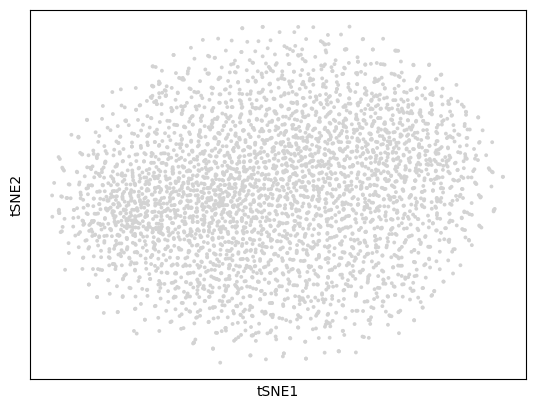

In [15]:
sc.tl.tsne(adata, perplexity=40, learning_rate=200, random_state=42)
sc.pl.tsne(adata)

In [16]:
# Get the embedding 
X_tsne = adata.obsm['X_tsne']

**K-means clustering**

In [17]:
from custom_functions import kmeans_fit

# Parameter grid for K-means
kmeans_param_grid = {
    'n_clusters': list(range(2,12)),
    'n_init': [10, 15, 20]
}

# Use our 
kmeans_labels_tsne, best_params_tsne = kmeans_fit(kmeans_param_grid, X_tsne)

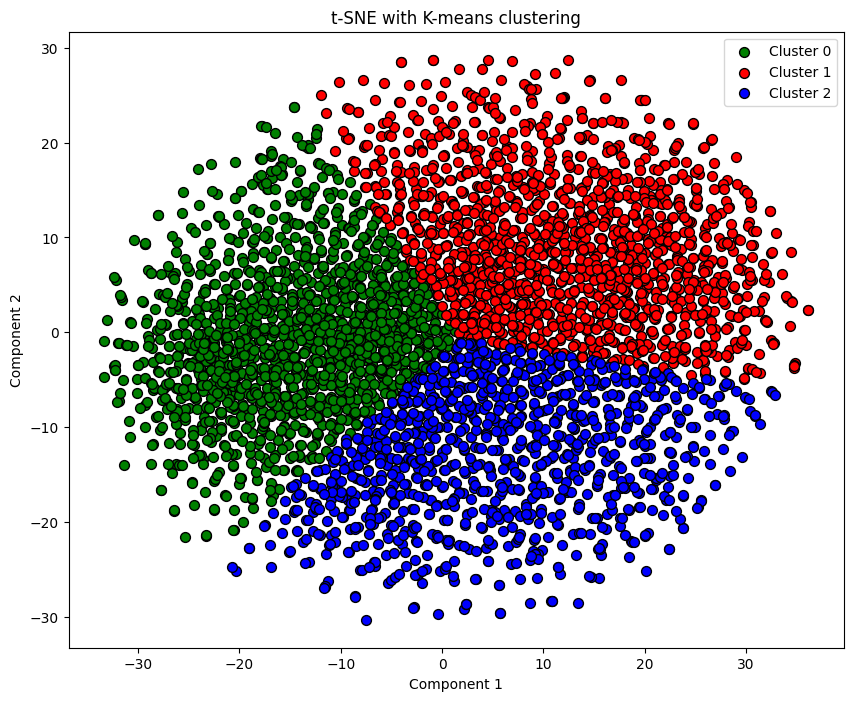

In [18]:
plot_clusters_2d(X_tsne, kmeans_labels_tsne, title="t-SNE with K-means clustering")

**GMM clustering**

In [19]:
from custom_functions import GMM_fit

gmm_param_grid = {
    'n_components': list(range(2,12)),
    'covariance_type': ['full', 'tied', 'diag', 'spherical']
}

gmm_labels_tsne, probas_tsne, _ = GMM_fit(gmm_param_grid, X_tsne)

Best GMM parameters: {'covariance_type': 'tied', 'n_components': 7}


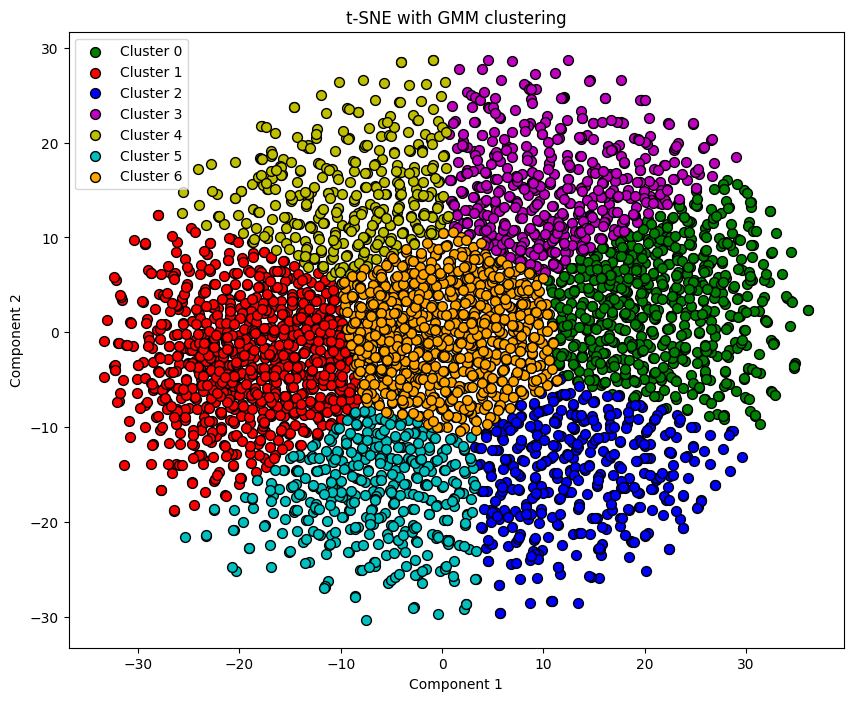

In [20]:
plot_clusters_2d(X_tsne, gmm_labels_tsne, title="t-SNE with GMM clustering")

**Attempt to replicate authors' results**

**Inspect embedding**

We inspect the embedding colored by each sample to ensure that there is no batch effect from the pooling process.

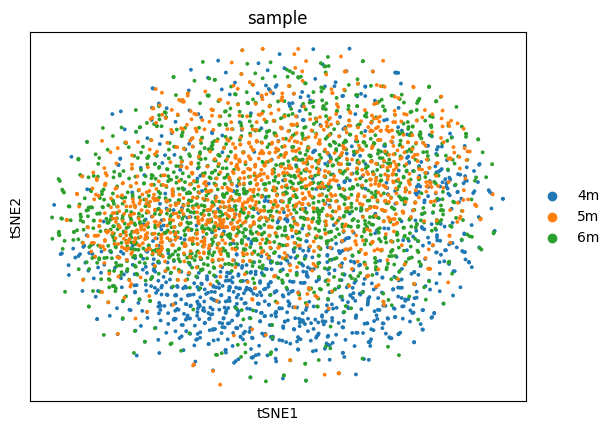

In [26]:
sc.pl.tsne(adata, color=['sample'])

**Hierarchical clustering**

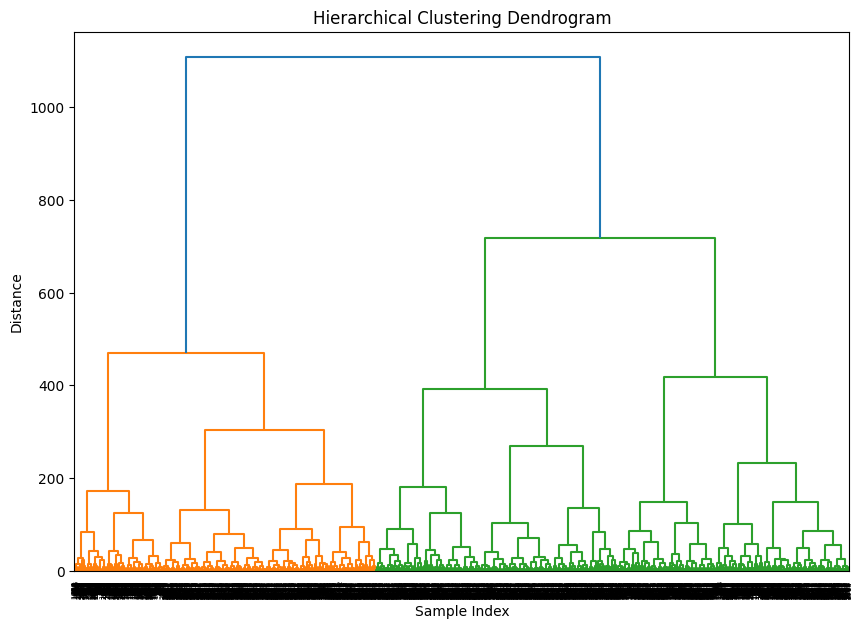

In [27]:
# Step 1: Compute the distance matrix
distance_matrix = pdist(adata.obsm['X_tsne'], metric='euclidean')

# Step 2: Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Step 3: Visualize the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

**Assigned clusters visualization**

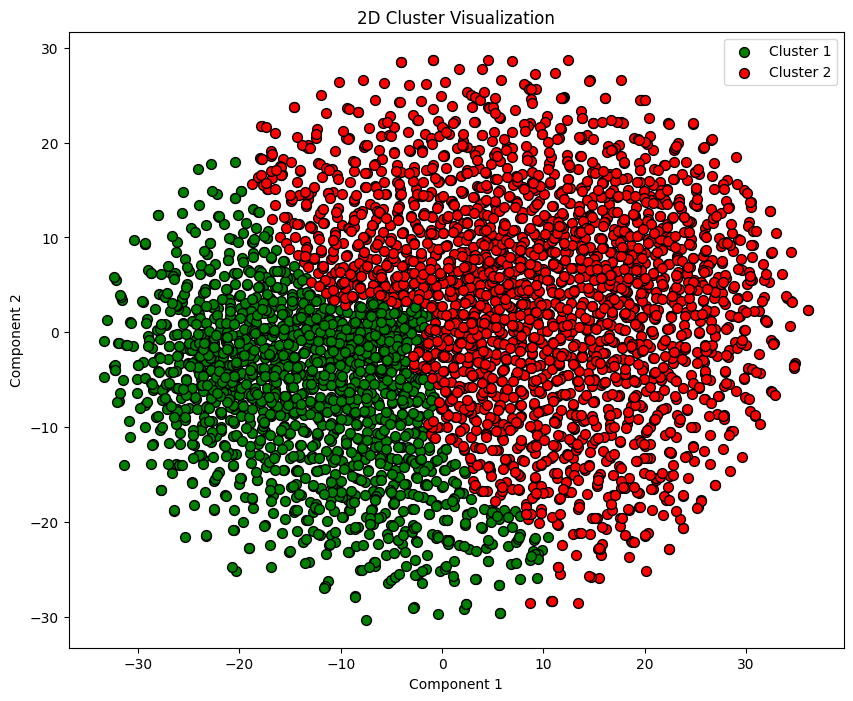

In [28]:
cluster_labels = fcluster(Z, t=2, criterion='maxclust')
plot_clusters_2d(adata.obsm['X_tsne'], cluster_labels)

**Identification of the top marker genes for each cluster**

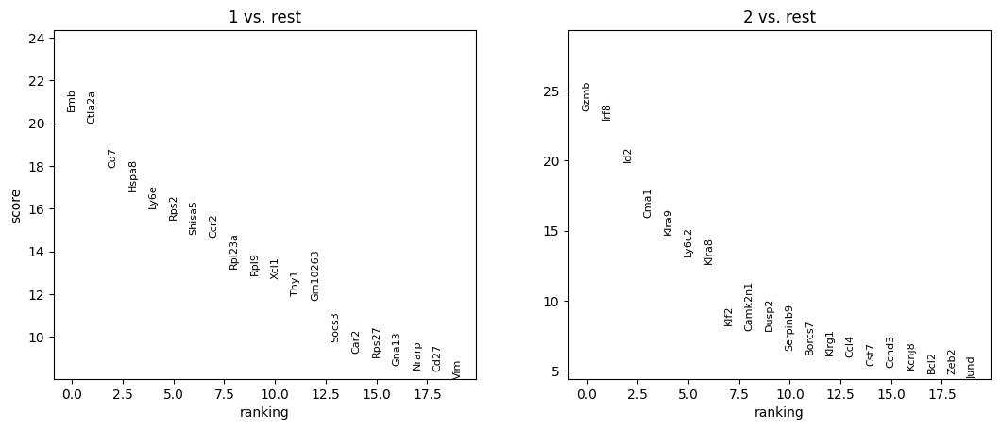

In [29]:
adata.obs['cluster_labels'] = pd.Categorical(cluster_labels)
# Identify marker genes
sc.tl.rank_genes_groups(adata, groupby='cluster_labels', method='wilcoxon', n_genes=20)

# Visualize the top marker genes
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

**Heatmap creation**

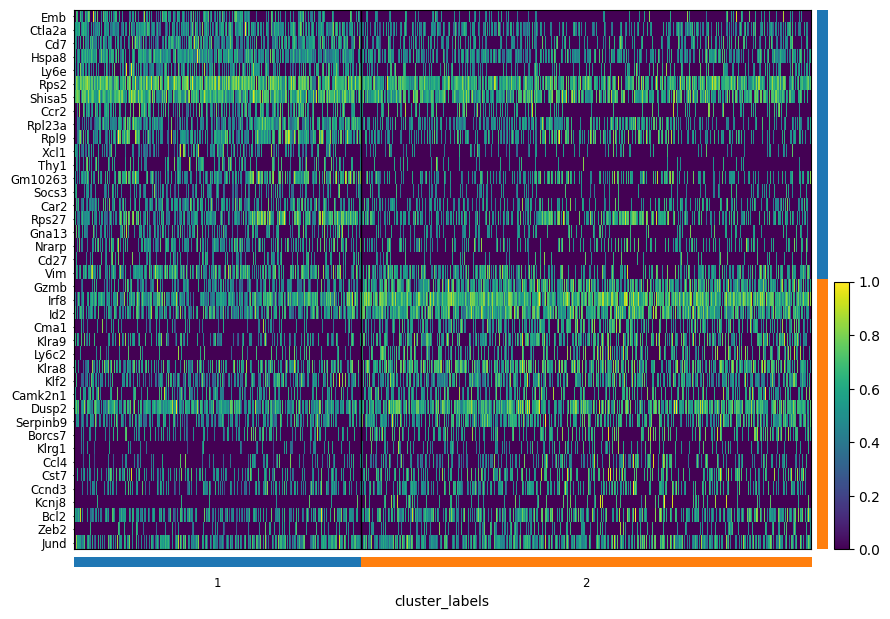

In [30]:
# Extract marker genes information
markers = adata.uns['rank_genes_groups']
cluster_key = 'cluster_labels'

adata.obs[cluster_key] = adata.obs[cluster_key].astype(str)

# Plot the marker genes using a heatmap
sc.pl.rank_genes_groups_heatmap(
    adata,
    n_genes=20,
    groupby=cluster_key,
    show_gene_labels=True,
    swap_axes = True,
    standard_scale='var',
    dendrogram=False
)

**Marker genes of each identified cluster**

In [32]:
markers = adata.uns['rank_genes_groups']['names']

cluster_1 = []
cluster_2 = []

for gene_tuple in markers:
    cluster_1.append(gene_tuple[0])
    cluster_2.append(gene_tuple[1])
 
print(cluster_1)
print(cluster_2)

['Emb', 'Ctla2a', 'Cd7', 'Hspa8', 'Ly6e', 'Rps2', 'Shisa5', 'Ccr2', 'Rpl23a', 'Rpl9', 'Xcl1', 'Thy1', 'Gm10263', 'Socs3', 'Car2', 'Rps27', 'Gna13', 'Nrarp', 'Cd27', 'Vim']
['Gzmb', 'Irf8', 'Id2', 'Cma1', 'Klra9', 'Ly6c2', 'Klra8', 'Klf2', 'Camk2n1', 'Dusp2', 'Serpinb9', 'Borcs7', 'Klrg1', 'Ccl4', 'Cst7', 'Ccnd3', 'Kcnj8', 'Bcl2', 'Zeb2', 'Jund']
